# Deep Learning for Computer Vision: Final Project

## Computer Science: COMS W 4995 006

## Project Motorcycle Helmet Detection
### Participant: Ji Li (UNI: jl6069)
### Objectives
Wearing helmets significantly increase motorcycle riders’ chance of survival in accidents. Therefore, detecting helmet usage of motorcycle riders on road can be an important topic. In this project, the group collected custom image dataset of riding motorcycles and fine-tuned a Faster R-CNN model pretrained on COCO dataset with ResNet50 backbone.

### Download images from internet, filter images, label images
2790 images downloaded using icrawler by searching "riding motorcycle" on Google, Bing, and Flickr. 
Filterted down to 1662 images actually related to riding motorcycles

In [1]:
import os
from icrawler.builtin import GoogleImageCrawler, FlickrImageCrawler, BingImageCrawler

# create a folder to save the downloaded images
current_dir = os.getcwd()
image_dir = "dataset\downloaded_images"
image_path = os.path.join(current_dir, image_dir)
if not os.path.exists(image_path): os.mkdir(image_path)

# use icrawler to search and download images of people riding motorcycles
# google_crawler = GoogleImageCrawler(downloader_threads=4, storage={'root_dir': image_dir})
# google_crawler.crawl(keyword='riding motorcycle', min_size=(400,400), max_num=1000, file_idx_offset=0)
# bing_crawler = BingImageCrawler(downloader_threads=4, storage={'root_dir': image_dir})
# bing_crawler.crawl(keyword='riding motorcycle', min_size=(400,400), max_num=1000, file_idx_offset='auto')
# flickr_crawler = FlickrImageCrawler(apikey='4547c52c77184477e00712ce1804ff4f', storage={'root_dir': image_dir}, downloader_threads=4)
# flickr_crawler.crawl(text='riding motorcycle', min_size=(400,400), max_num=2000, file_idx_offset='auto')

In [2]:
# rename the selected images
selected_image_dir = "dataset\selected_images"
selected_image_path = os.path.join(current_dir, selected_image_dir)
# for i, image_name in enumerate(os.listdir(selected_image_path)):
#     old_file_path = os.path.join(selected_image_path, image_name)
#     file_name, file_extension = os.path.splitext(image_name)
#     file_name = "image_" + str(i).zfill(5)
#     new_image_name = f'{file_name}{file_extension}'
#     new_file_path = os.path.join(selected_image_path, new_image_name)
#     os.rename(old_file_path, new_file_path)

Images were manually annotated using VoTT, currently 438 images tagged. 
Three categories of object are labeled in these images: 'motorcycle','person','helmet'

In [4]:
import numpy as np
import cv2
from torchvision import transforms
# category names of objects to be detected
categories = ['__background__','motorcycle','person','helmet']
# set the corresponding colors for each category
bbox_colors = ((0,0,0),(255,77,77),(153,153,255),(77,153,77))
# create a function to convert text labels to numeric labels
def category2label(category):
    if category == 'motorcycle' : return 1
    elif category == 'person': return 2
    elif category == 'helmet': return 3
    else: return 0

### Create a custom dataset class that inherit torch Dataset class

In [5]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch
import pandas as pd
import cv2
# create custom dataset class
class HelmetDetectionDataset(Dataset):
    def __init__(self, annotation_file, image_dir):
        super().__init__()
        self.image_dir = image_dir
        self.df = pd.read_csv(annotation_file)
        self.image_names = self.df['image'].unique()

    def __getitem__(self, index:int):
        # load image
        image_name = self.image_names[index]
        image_file = os.path.join(self.image_dir, image_name)
        image = cv2.imread(image_file)
        image = cv2.cvtColor(np.asarray(image), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        image = transforms.ToTensor()(image)
        # load bounding boxes in the image
        bboxes = self.df[self.df['image']==image_name]
        boxes = bboxes[['xmin','ymin','xmax','ymax']].values
        categories = bboxes['label'].values
        labels = []
        for category in categories: labels.append(category2label(category))
        labels = np.array(labels)

        target = {}
        target['boxes'] = torch.as_tensor(boxes, dtype=torch.float32)
        target['labels'] = torch.as_tensor(labels, dtype=torch.int64)
        # target['image_id'] = torch.as_tensor(index, dtype=torch.int64)

        return image, target

    def __len__(self):
        return len(self.image_names)

# create dataset
annotation_file = os.path.join(current_dir,"dataset/helmet_detection_tags.csv")
dataset = HelmetDetectionDataset(annotation_file, selected_image_path)

View smaple labeled images from the dataset

In [112]:
import matplotlib.pyplot as plt
# draw bounding boxes around objects
def draw_bboxes( image, boxes, labels):
    image = (image*255).permute(1,2,0).cpu().numpy().astype(np.uint8).copy()
    boxes, labels = boxes.cpu().numpy(), labels.cpu().numpy().astype(np.uint8)
    size = int(image.shape[0]*image.shape[1]/(2000*2000))+2
    if len(labels) !=0:
        for i, box in enumerate(boxes):
            color = bbox_colors[labels[i]]
            cv2.rectangle(image, (int(box[0]),int(box[1])),
                                 (int(box[2]),int(box[3])), color, size*2)
            cv2.putText(image, categories[labels[i]],
                            ( int(box[0]), int(box[1])-5 ),
                            cv2.FONT_HERSHEY_SIMPLEX, size, color, size*2, cv2.LINE_AA)
    return image

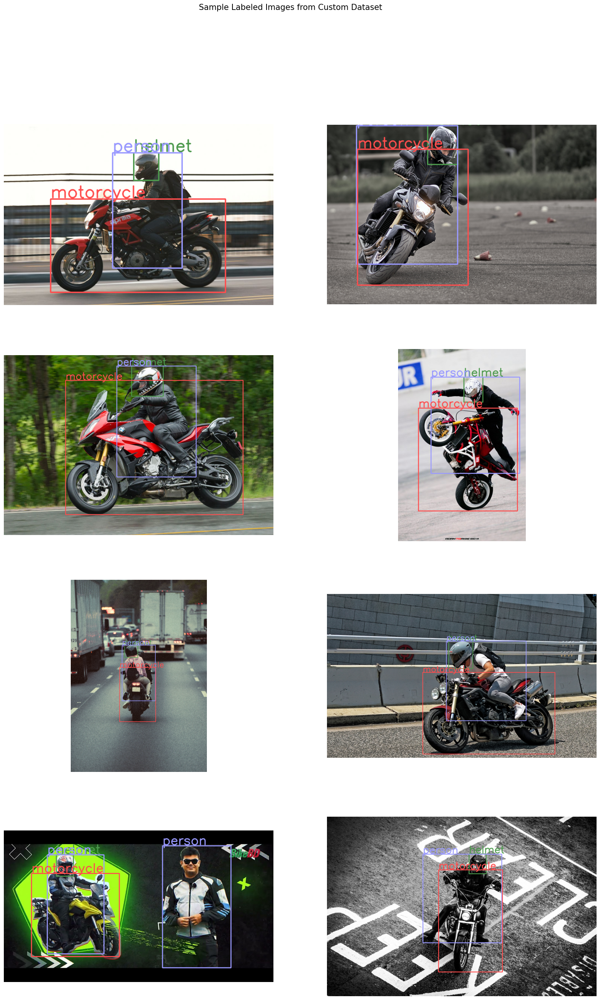

In [7]:
# view sample images with labeled objects
plt.figure(figsize=(20,30))
plt.suptitle("Sample Labeled Images from Custom Dataset", fontsize=15)
i = 1
for image, target in dataset:
    plt.subplot(4,2,i)
    image_tagged = draw_bboxes(image, target['boxes'], target['labels'])
    plt.axis("off")
    plt.imshow(image_tagged)
    if i == 8: break
    i+=1

### Use Faster R-CNN model and pretrained weights from pytorch. Finetuning parameters on my custom dataset.

In [8]:
# check gpu device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
print('{:.4f}GB'.format(torch.cuda.memory_allocated(device)/(1024**3)))

Using cuda device
0.0000GB


In [9]:
# use pretrained faster rcnn model from pytorch as start point
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models import ResNet50_Weights
import torch.nn as nn
# create faster-rcnn model with pretrained weights and backbone weights
faster_rcnn = fasterrcnn_resnet50_fpn_v2(weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT, 
                                         weights_backbone=ResNet50_Weights.DEFAULT,
                                         trainable_backbone_layers=0)
# modify structure of the model to predict only desired categories including __background__
in_features = faster_rcnn.roi_heads.box_predictor.cls_score.in_features
faster_rcnn.roi_heads.box_predictor = FastRCNNPredictor(in_features, 4)
print('New box predictor:',faster_rcnn.roi_heads.box_predictor)
# print(faster_rcnn)

New box predictor: FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=4, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=16, bias=True)
)


In [83]:
# parameters to be tuned are at fpn, rpn, roi layers
num_params = sum(param.numel() for param in faster_rcnn.parameters() if param.requires_grad)
print('Number of parameters to be optimized:', num_params)

Number of parameters to be optimized: 19758371


Split the dataset to test-train sets, use Dataloader to load data to model

In [11]:
# split the dataset in train and test set
indices = torch.randperm(len(dataset)).tolist()
dataset_train = torch.utils.data.Subset(dataset, indices[:round(len(indices)*0.8)])
dataset_test = torch.utils.data.Subset(dataset, indices[round(len(indices)*0.8):])
print('dataset size:',len(indices))
print('train size:',len(dataset_train.indices))
print('test size:',len(dataset_test.indices))
# create dataloaders
train_dl = DataLoader(dataset_train, batch_size=2, num_workers=0, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
test_dl = DataLoader(dataset_test, batch_size=2, num_workers=0, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

dataset size: 438
train size: 350
test size: 88


In [12]:
# training function for custom dataset
def train(model, f_opt, epochs=3):
    iter = 0
    model = model.to(device)
    train_loss, test_loss = [], []
    for epoch in range(epochs):
        for images, targets in train_dl:
            model.train()
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            loss_value = losses.item()
            f_opt.zero_grad()
            losses.backward()
            f_opt.step()
            
            if(iter%5==0):
                model.eval()
                loss_test = test(model)
                test_loss.append(loss_test)
                train_loss.append(loss_value)

                if(iter%50==0):
                    with torch.no_grad():
                        print('[Epoch{}/{}] Iteration{}: train loss:{:.4f}, test loss:{:.4f}'.format(
                            epoch+1, epochs, iter, loss_value, loss_test))

            iter +=1
    plt.plot(train_loss, label='training_loss')
    plt.plot(test_loss, label='test_loss')
    plt.legend()
    plt.show()
    
    return model

In [13]:
def test(model):
    model = model.to(device)
    model.train()
    with torch.no_grad():
        for images, targets in test_dl:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            test_loss = losses.item()
            break
    return test_loss

    

[Epoch1/5] Iteration0: train loss:1.6651, test loss:1.0613
[Epoch1/5] Iteration50: train loss:0.4112, test loss:0.2372
[Epoch1/5] Iteration100: train loss:0.3952, test loss:0.2450
[Epoch1/5] Iteration150: train loss:0.3923, test loss:0.1769
[Epoch2/5] Iteration200: train loss:0.2613, test loss:0.2784
[Epoch2/5] Iteration250: train loss:0.1058, test loss:0.1618
[Epoch2/5] Iteration300: train loss:0.2841, test loss:0.3943
[Epoch3/5] Iteration350: train loss:0.0933, test loss:0.3584
[Epoch3/5] Iteration400: train loss:0.1335, test loss:0.4235
[Epoch3/5] Iteration450: train loss:0.2192, test loss:0.3097
[Epoch3/5] Iteration500: train loss:0.2303, test loss:0.2097
[Epoch4/5] Iteration550: train loss:0.0976, test loss:0.2572
[Epoch4/5] Iteration600: train loss:0.3081, test loss:0.8311
[Epoch4/5] Iteration650: train loss:0.1665, test loss:0.4192
[Epoch5/5] Iteration700: train loss:0.1631, test loss:0.1545
[Epoch5/5] Iteration750: train loss:0.0678, test loss:0.2735
[Epoch5/5] Iteration800: tr

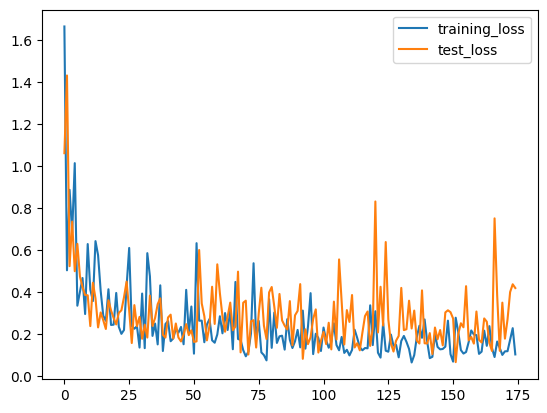

In [14]:
# construct an optimizer
params = [p for p in faster_rcnn.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.00005)
# train the model
faster_rcnn = train(faster_rcnn, optimizer, 5)

In [89]:
# save the model to folder
model_save_path = os.path.join(current_dir,"saved_models\model_4.pth")
torch.save(faster_rcnn.state_dict(),model_save_path)

In [90]:
# memory allocated in gpu after training
print('GPU Allocated Memory: {:.4f}GB'.format(torch.cuda.memory_allocated(device)/(1024**3)))

GPU Allocated Memory: 0.6821GB


In [103]:
# detecting objects using trained model
def pred(model, dataset):
    model.to(device)
    model.eval()
    with torch.no_grad():
        images, targets = next(iter(dataset))
        images = list(image.to(device) for image in images)
        targets_ = model(images)
    targets_ = refine_bboxes(targets_)
    return images, targets_

# write a function to filter proposed objects by a threshold and combine overlapping proposals
def refine_bboxes(targets):
    # filter bounding box by threshold 0.8
    filtered_targets = []
    for target in targets:
        target['boxes'] = list(target['boxes'].cpu())
        target['labels'] = target['labels'].cpu()
        target['scores'] = target['scores'].cpu()
        # convert dic to dataframe, filter by score > threshold
        target = pd.DataFrame(target)
        # print('target before threshold:',target)
        target = target[target['scores']>0.8]
        # print('target after threshold:',target)
        # combine overlapping bounding boxes using non maximum suppression
        # target = nms(target)
        filtered_targets.append(target)
    return filtered_targets
    
# non maximum suppression to avoid overlapping prediction
def nms(target):
    labels = target['labels'].unique()
    target_filtered = []
    # check if box with same label has overlapping over a threshold
    for label in labels:
        target_to_eval = target[target['labels']==label]
        target_to_eval.reset_index(drop=True, inplace=True)
        while len(target_to_eval)>0:
            # pick out the box with highest score
            target_filtered.append(target_to_eval.iloc[0])
            target_to_eval.drop(index=0, inplace=True)
            target_to_eval.reset_index(drop=True, inplace=True)
            box1 = target_filtered[-1]['boxes']
            # compare the highest scored box with the rest boxes,
            # drop the ones that overlap > threshold
            for i, target_remain in target_to_eval.iterrows():
                box2 = target_remain['boxes']
                overlapped = calcIoU(box1, box2, threshold=0.7)
                if overlapped: target_to_eval.drop(index=i, inplace=True)
            target_to_eval.reset_index(drop=True, inplace=True)   
    # return the filtered dataframe
    target_filtered = pd.DataFrame(target_filtered)
    return target_filtered

# calculate intersection over union to decide wether combine two bounding boxes
def calcIoU(box1, box2, threshold):
    # coordinates of bounding boxes: a:[top left point], b:[bottom right point]
    a1x, a1y, b1x, b1y = box1[0], box1[1], box1[2], box1[3]
    a2x, a2y, b2x, b2y = box2[0], box2[1], box2[2], box2[3]
    # find intersections of bouding boxes
    ax, ay = max(a1x, a2x), max(a1y, a2y)
    bx, by = min(b1x, b2x), min(b1y, b2y)
    # intersection area
    w, h = max(0, bx-ax), max(0, by-ay)
    intersection_area = w*h
    # union area
    area1, area2 = (b1x-a1x)*(b1y-a1y), (b2x-a2x)*(b2y-a2y)
    union_area = area2 + area1 - intersection_area
    # intersection over union
    IoU = intersection_area/union_area
    if IoU > threshold:
        return True
    else:
        return False

### Make predictions using trained model

In [104]:
# load trained model
model_save_path = os.path.join(current_dir,"saved_models\model_3.pth")
model_eval = torch.load(model_save_path)

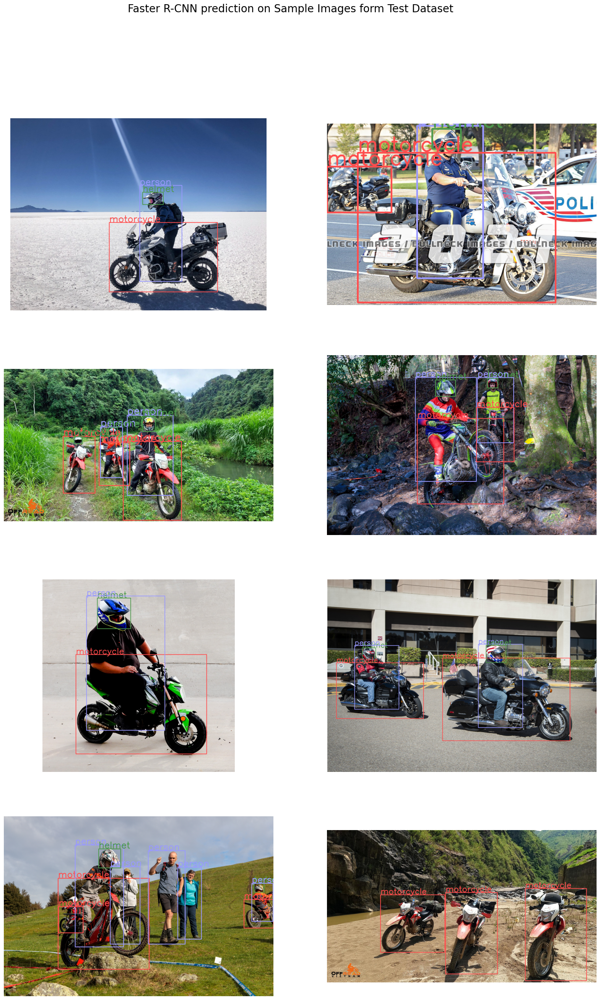

In [119]:
# view the predicted objection detection
plt.figure(figsize=(20,30))
plt.suptitle("Faster R-CNN prediction on Sample Images form Test Dataset", fontsize=20)
k = 1
m = 4
for j in range(m):
    images, targets_ = pred(faster_rcnn, test_dl)
    for i in range(len(images)):
            image, target = images[i], targets_[i]
            labels = torch.as_tensor(list(target['labels']), dtype=torch.int64)
            boxes = torch.stack(list(target['boxes']))
            plt.subplot(m,2,k)
            image_tagged = draw_bboxes(image, boxes, labels)
            plt.axis("off")
            plt.imshow(image_tagged)
            k+=1